In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns


In [4]:
data = pd.read_csv("Walmart DataSet.csv")

In [5]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [7]:
#convert date column to datetime format 
data['Date']= pd.to_datetime(data['Date'],format='%d-%m-%Y')

In [8]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [10]:
#ensure date is sorted by dates 
data.sort_values(by='Date',inplace=True)

In [11]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1287,10,2010-02-05,2193048.75,0,54.34,2.962,126.442065,9.765
5148,37,2010-02-05,536006.73,0,45.97,2.572,209.852966,8.554
2288,17,2010-02-05,789036.02,0,23.11,2.666,126.442065,6.548
4147,30,2010-02-05,465108.52,0,39.05,2.572,210.752605,8.324


In [12]:
#handle missing values
data.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

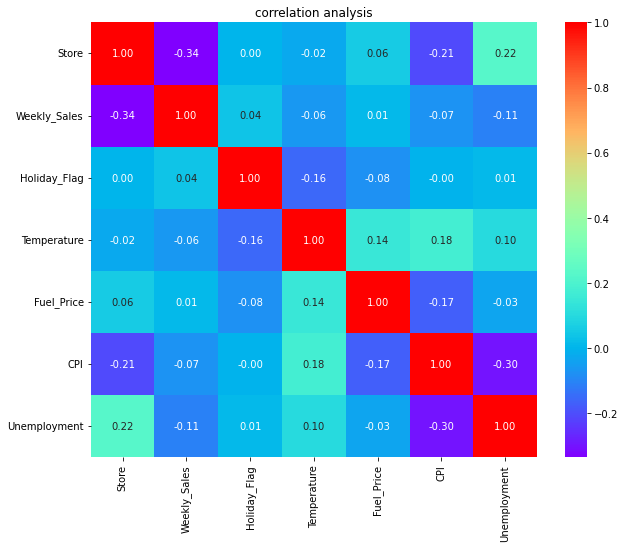

In [13]:
#correlation analysis 
correlation_matrix = data.corr()

#plot the heatmap 
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix,annot=True,cmap='rainbow',fmt=".2f")
plt.title('correlation analysis')
plt.show()

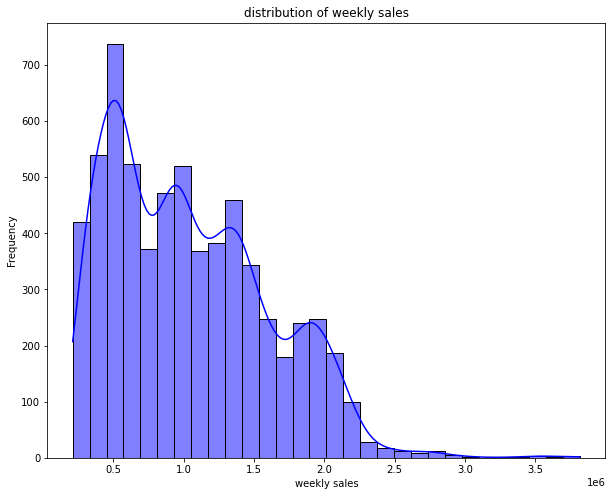

In [15]:
#weekly sales distribution 
plt.figure(figsize=(10,8))
sns.histplot(data['Weekly_Sales'],kde=True,bins=30,color='blue')
plt.title('distribution of weekly sales')
plt.xlabel('weekly sales')
plt.ylabel('Frequency')
plt.show()


In [16]:
#show this as a plotly graph 
import plotly.express as px

fig = px.histogram(data,x='Weekly_Sales',nbins=30,title='Distribution of weekly sales',color_discrete_sequence=['blue'],marginal='box')
fig.update_layout(xaxis_title="Weekly Sales",
    yaxis_title="Frequency",
    template="plotly_white"
)

# Show the plot
fig.show()

In [17]:
#weekly sales and unemployment relation 

fig = px.scatter(data,x='Unemployment',y='Weekly_Sales',color='Store',title='weekly sales vs unemployment',labels={'Unemployment':'unemployment rate','Weekly_Sales':'weekly sales rate'},color_continuous_scale='Viridis',hover_data=['Date'])

fig.update_layout(xaxis_title="unemployment rate",
    yaxis_title="Weekly sales rate",
    template="plotly_white"
)

# Show the plot
fig.show()

In [21]:
#find the stores most affected by unemployment 
store_unemployment = data.groupby('Store')[['Unemployment','Weekly_Sales']].corr().iloc[0::2,1].reset_index()
store_unemployment.columns=['Store', '_', 'Correlation']
store_unemployment = store_unemployment.sort_values(by='Correlation',ascending=True)
store_unemployment.head()

,Store,_,Correlation
37,38,Unemployment,-0.785290
43,44,Unemployment,-0.780076
38,39,Unemployment,-0.384681
41,42,Unemployment,-0.356355
40,41,Unemployment,-0.350630


##so it is clearly stated that store no 38 is mostly affected by unemployment rate 

In [23]:
##If the weekly sales show a seasonal trend, when and what could be the reason?

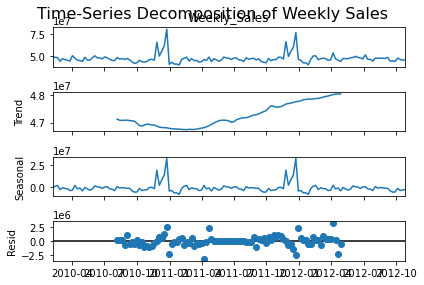

In [28]:
from statsmodels.tsa.seasonal import seasonal_decompose

#aggregate sales data across all stores 
sales_trend = data.groupby('Date')['Weekly_Sales'].sum()

#perform time series decomposition
decomposition = seasonal_decompose(sales_trend,model='additive', period=52)
decomposition.plot()
plt.suptitle("Time-Series Decomposition of Weekly Sales", fontsize=16)
plt.show()

In [27]:
#highlight seasonality using plotly 
import plotly.graph_objects as go 

seasonal = decomposition.seasonal 

#plot seasonal component
# Plot seasonal component
fig = go.Figure()
fig.add_trace(go.Scatter(x=seasonal.index, y=seasonal, mode='lines', name='Seasonal Component', line=dict(color='blue')))
fig.update_layout(
    title="Seasonal Component of Weekly Sales",
    xaxis_title="Date",
    yaxis_title="Seasonal Effect",
    template="plotly_white"
)
fig.show()

## so it is clearly visible that sales has its seasonal peak at nov and dec month in 2010 and 2011 which may be arises due to holiday season 

In [29]:
#Does temperature affect the weekly sales in any manner?

fig = px.scatter(data,x='Temperature',y='Weekly_Sales',color='Store',title='weekly sales vs temperature',labels={'Temperature':'temperture F','Weekly_Sales':'weekly sales rate'},color_continuous_scale='Viridis',hover_data=['Date'])

fig.update_layout(xaxis_title="Temperature F",
    yaxis_title="Weekly sales rate",
    template="plotly_white"
)

# Show the plot
fig.show()

In [30]:
#calculate the correlation between temperature and weekly sales 
correlation = data['Weekly_Sales'].corr(data['Temperature'])
print(f'Correlation between Temperature and weekly_sales:{correlation}')

Correlation between Temperature and weekly_sales:-0.06381001317946955


#A negative value indicates sales decrease with temperature.

In [31]:
#How is the Consumer Price index affecting the weekly sales of various stores?
fig = px.scatter(data,x='CPI',y='Weekly_Sales',color='Store',title='weekly sales vs temperature',labels={'CPI':'Consumer price index','Weekly_Sales':'weekly sales rate'},color_continuous_scale='Viridis',hover_data=['Date'])

fig.update_layout(xaxis_title="Consumer price index",
    yaxis_title="Weekly sales rate",
    template="plotly_white"
)

# Show the plot
fig.show()

In [32]:
#calculate the correlation between CPI and weekly sales 
correlation = data['Weekly_Sales'].corr(data['CPI'])
print(f'Correlation between consumer price index and weekly_sales:{correlation}')

Correlation between consumer price index and weekly_sales:-0.07263416204017628


#Consumer price index and weekly sales are strong negative correlation so weekly sales decreases with CPI 

In [34]:
#Top performing stores according to the historical data.

#calculate top stores by sales 

store_performance=data.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False)

top_5_stores = store_performance.head(5).reset_index()

fig = px.bar(
    top_5_stores,
    x='Store',
    y='Weekly_Sales',
    title="Top 5 Performing Stores by Total Sales",
    labels={"Store": "Store", "Weekly_Sales": "Total Sales"},
    text='Weekly_Sales',  # Display sales values on bars
    color='Weekly_Sales',  # Color based on total sales
    color_continuous_scale='viridis'
)

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    xaxis=dict(tickmode="linear"),
    yaxis_title="Total Sales",
    xaxis_title="Store",
    template="plotly_white"
)

# Show the plot
fig.show()

In [35]:
#The worst performing store, and how significant is the difference between the highest and lowest performing stores

print('the worst performing store is :')
print(store_performance.tail(1))


print('the difference between the highest and lowest performing stores :')
print(store_performance.max()-store_performance.min())

the worst performing store is :
Store
33    37160221.96
Name: Weekly_Sales, dtype: float64
the difference between the highest and lowest performing stores :
264237570.49999997


In [41]:
#Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks.

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA 

store_sales = data.groupby(['Store','Date'])['Weekly_Sales'].sum().reset_index()

store_sales

,Store,Date,Weekly_Sales
0,1,2010-02-05,1643690.90
1,1,2010-02-12,1641957.44
2,1,2010-02-19,1611968.17
3,1,2010-02-26,1409727.59
4,1,2010-03-05,1554806.68
...,...,...,...
6430,45,2012-09-28,713173.95
6431,45,2012-10-05,733455.07
6432,45,2012-10-12,734464.36
6433,45,2012-10-19,718125.53



Forecasting for Store 1:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



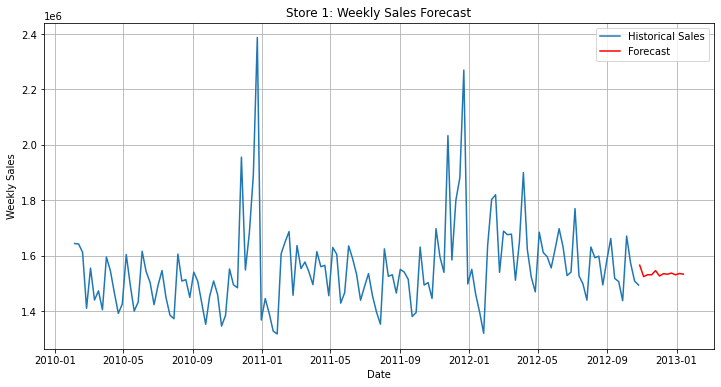


Forecasting for Store 10:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



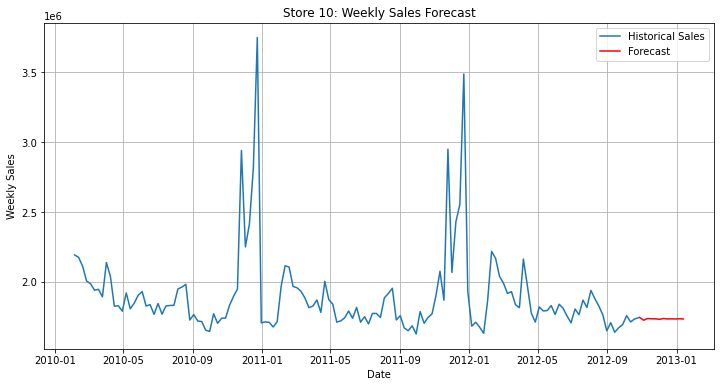


Forecasting for Store 37:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



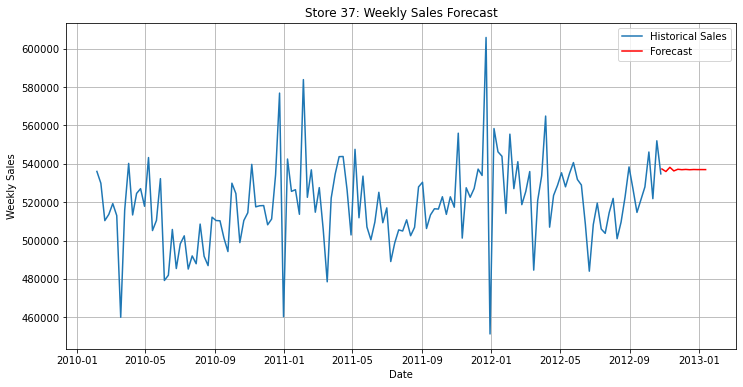


Forecasting for Store 17:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



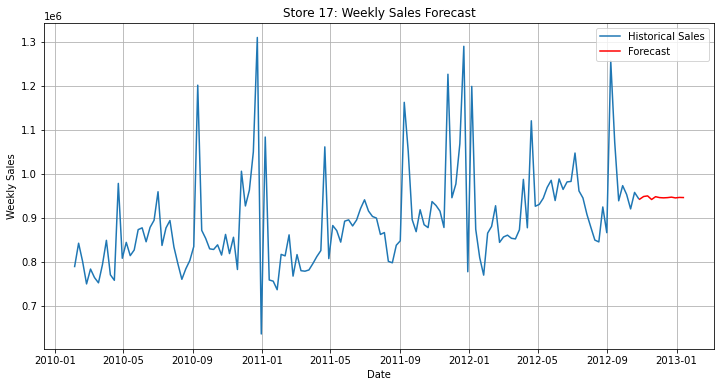


Forecasting for Store 30:
store 30 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



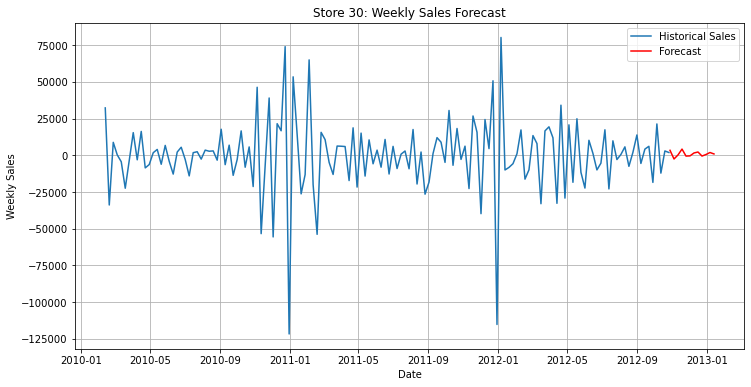


Forecasting for Store 25:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



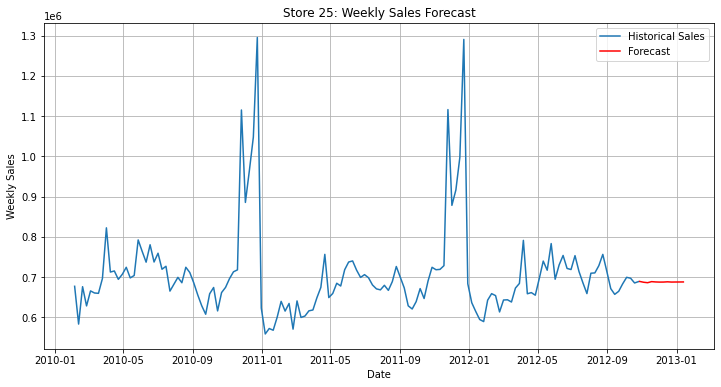


Forecasting for Store 22:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



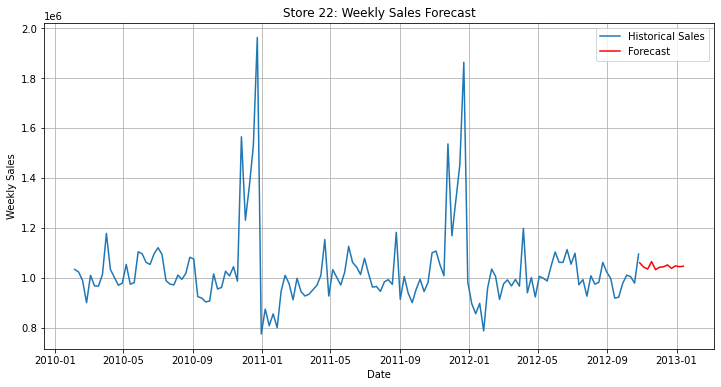


Forecasting for Store 23:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



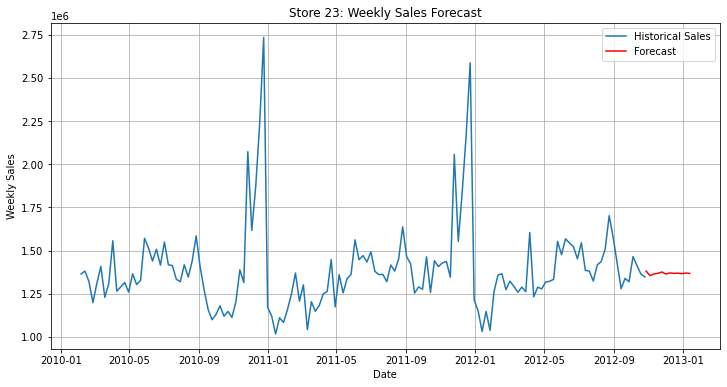


Forecasting for Store 24:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



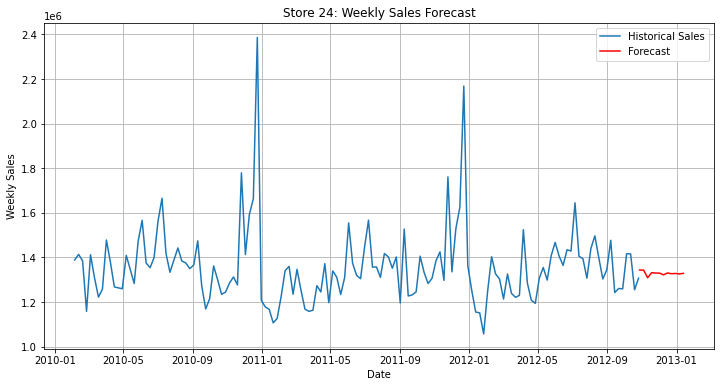


Forecasting for Store 19:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



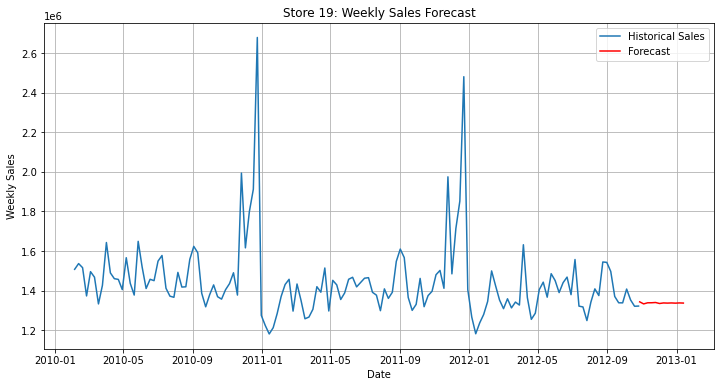


Forecasting for Store 21:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



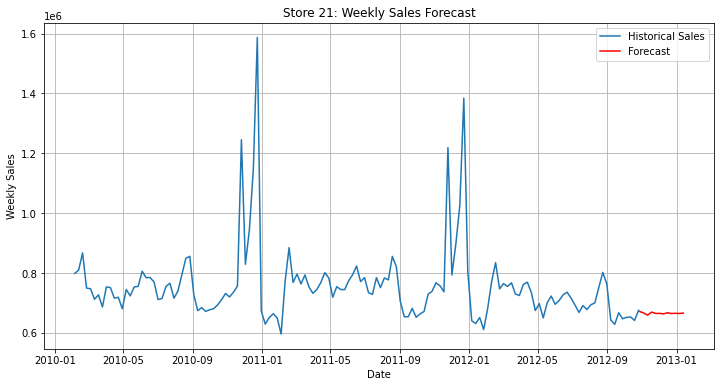


Forecasting for Store 26:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



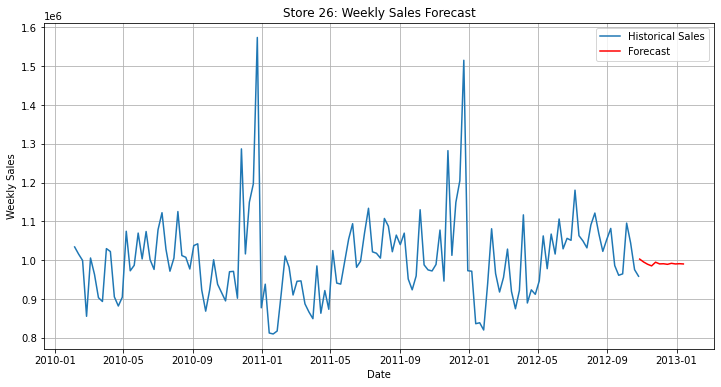


Forecasting for Store 39:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



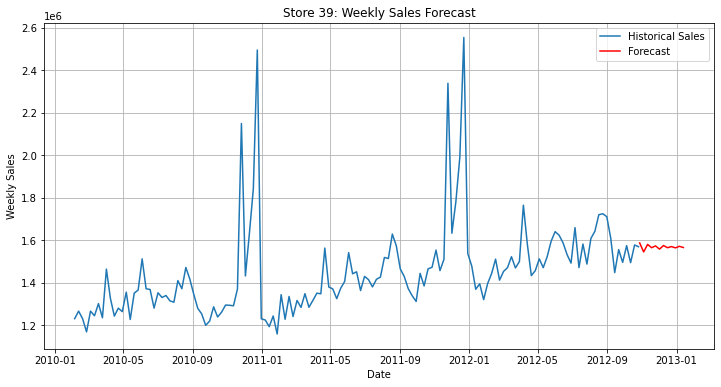


Forecasting for Store 8:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



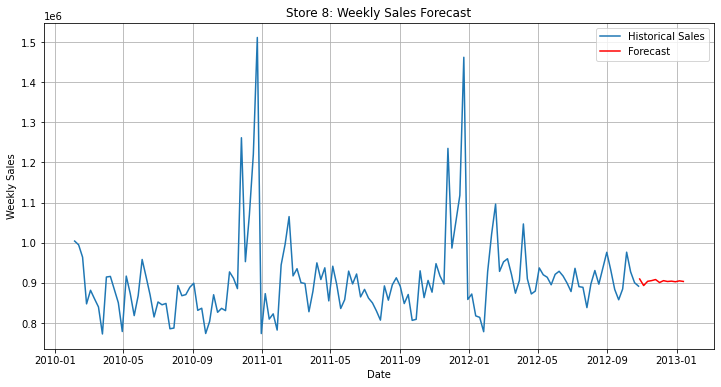


Forecasting for Store 32:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



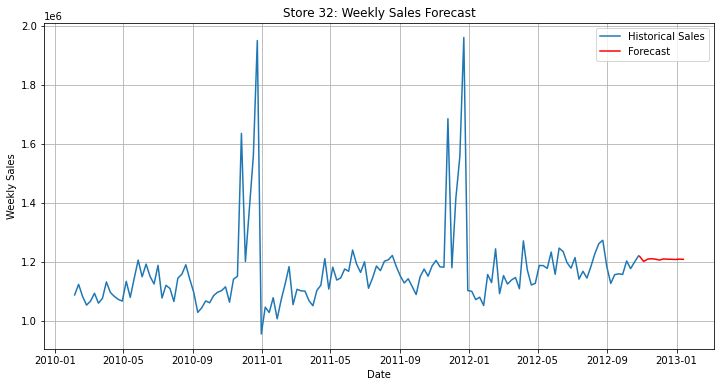


Forecasting for Store 15:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



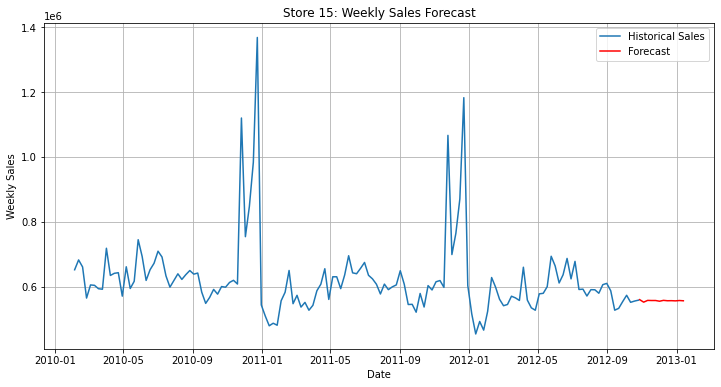


Forecasting for Store 34:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



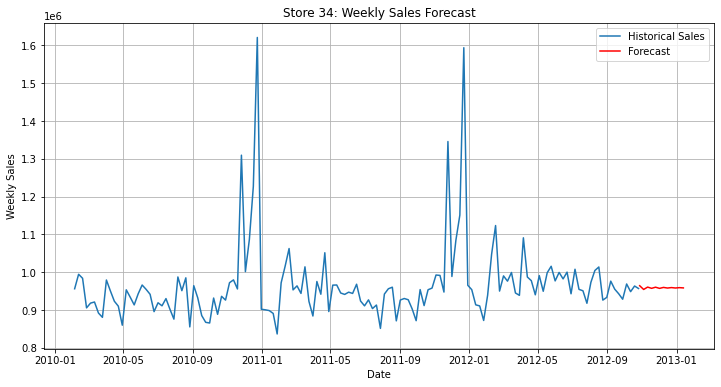


Forecasting for Store 13:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



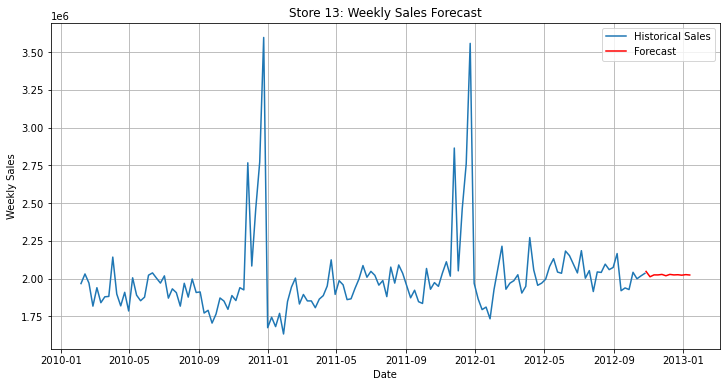


Forecasting for Store 38:
store 38 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



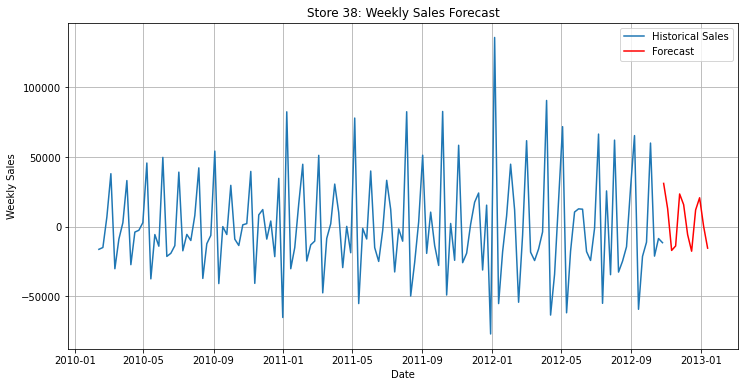


Forecasting for Store 9:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



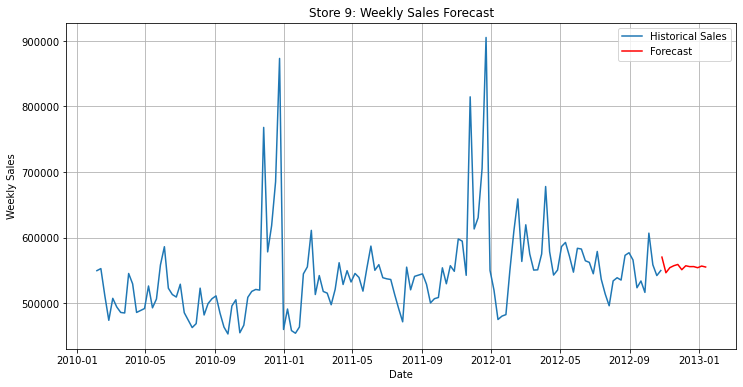


Forecasting for Store 2:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



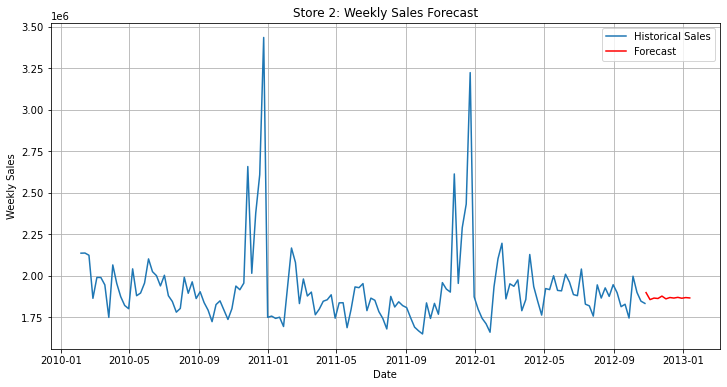


Forecasting for Store 45:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



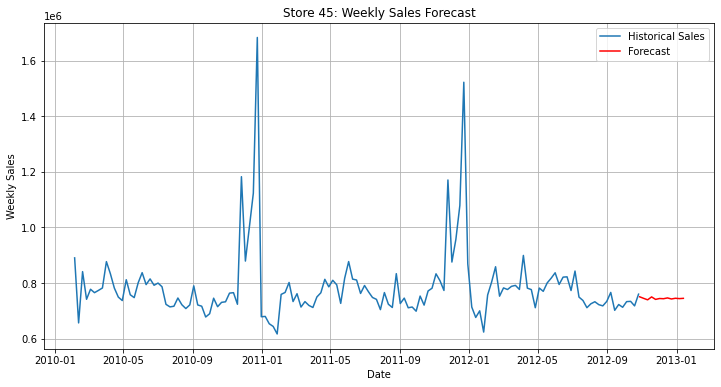


Forecasting for Store 20:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



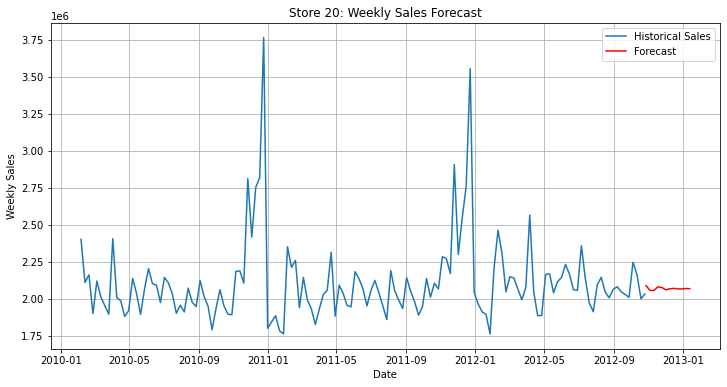


Forecasting for Store 27:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



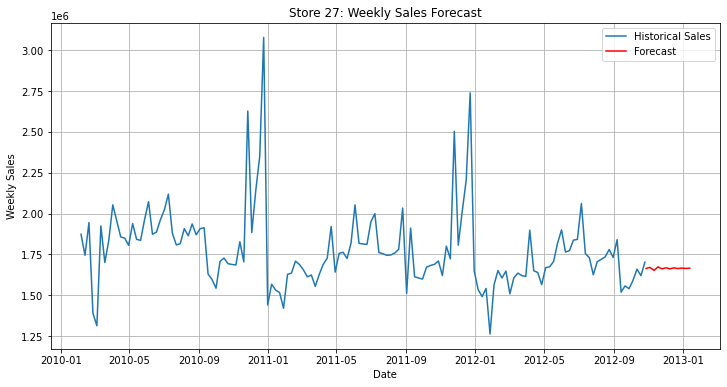


Forecasting for Store 41:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



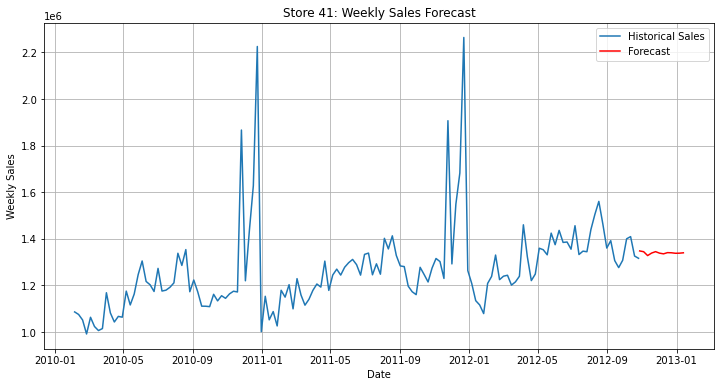


Forecasting for Store 4:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



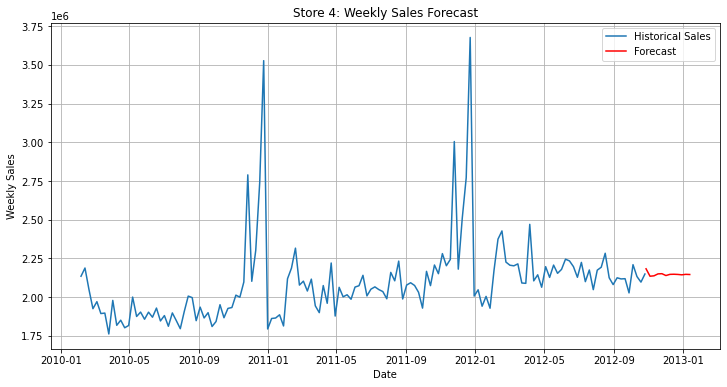


Forecasting for Store 31:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



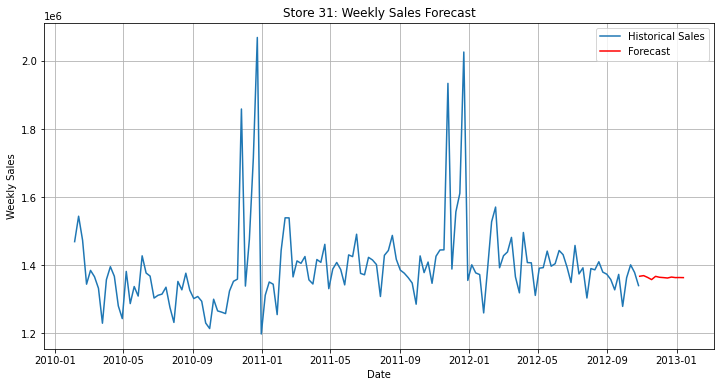


Forecasting for Store 16:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



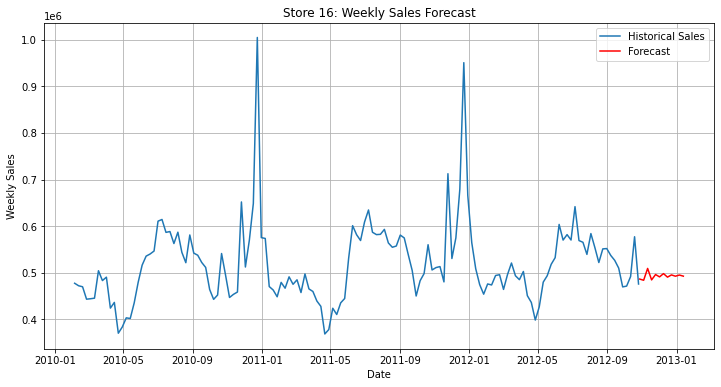


Forecasting for Store 11:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



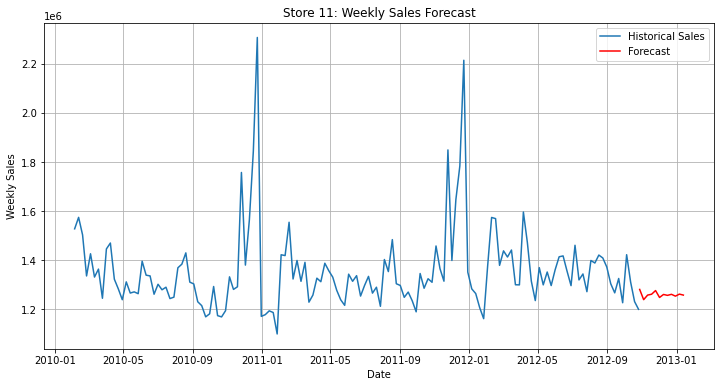


Forecasting for Store 36:
store 36 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



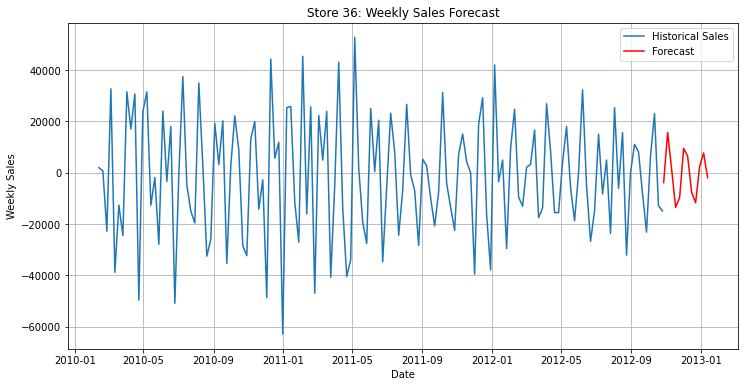


Forecasting for Store 42:
store 42 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



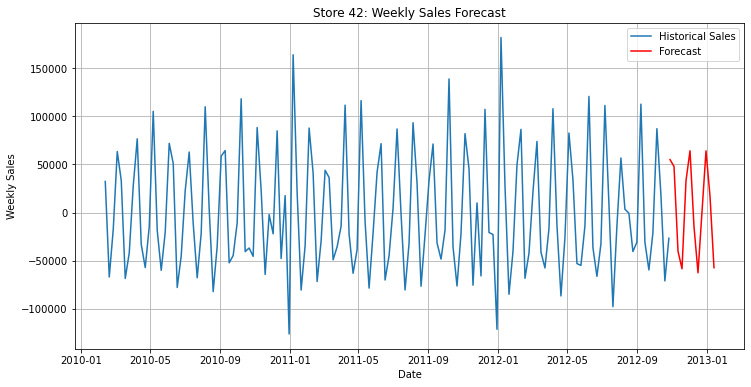


Forecasting for Store 5:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



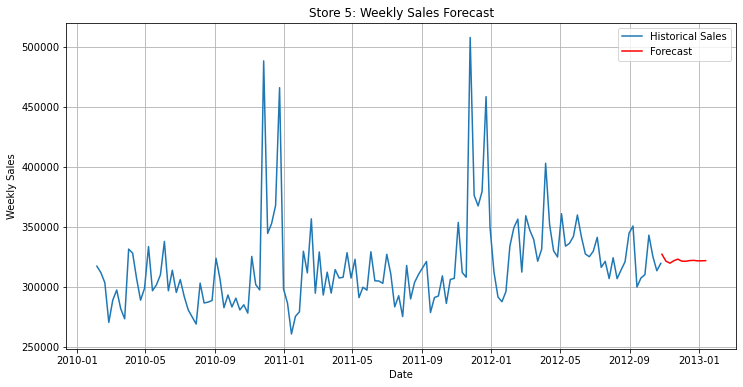


Forecasting for Store 43:
store 43 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



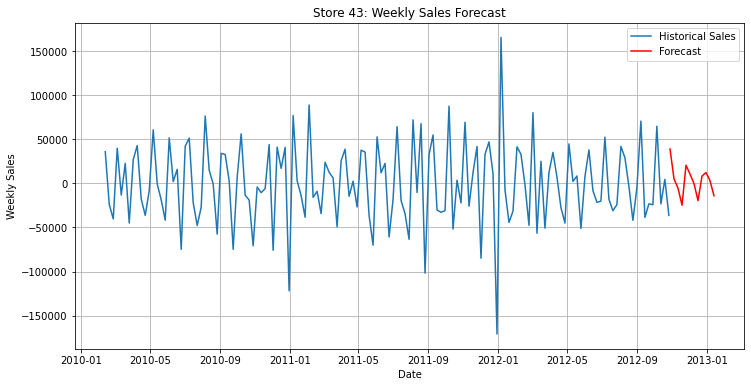


Forecasting for Store 35:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



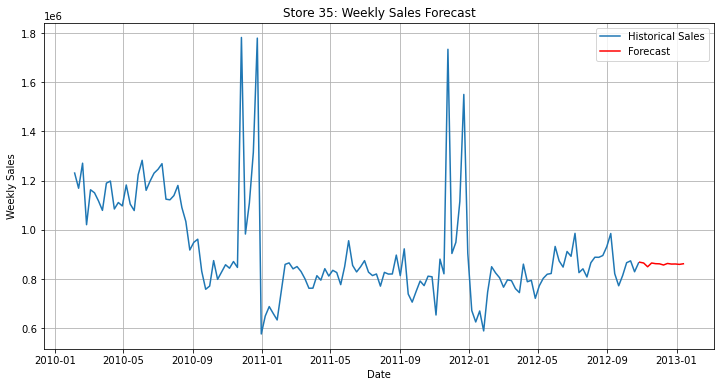


Forecasting for Store 28:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



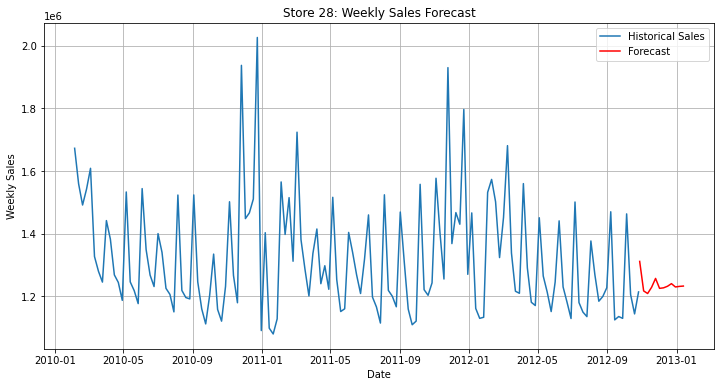


Forecasting for Store 6:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



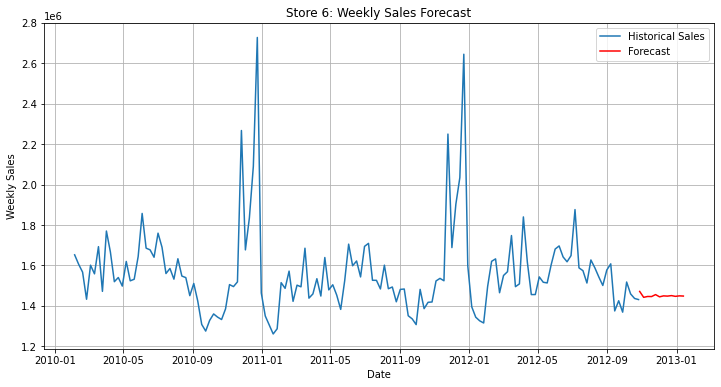


Forecasting for Store 33:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



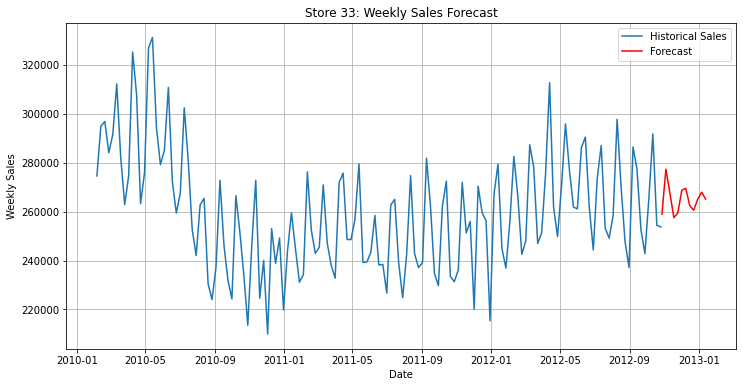


Forecasting for Store 44:
store 44 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



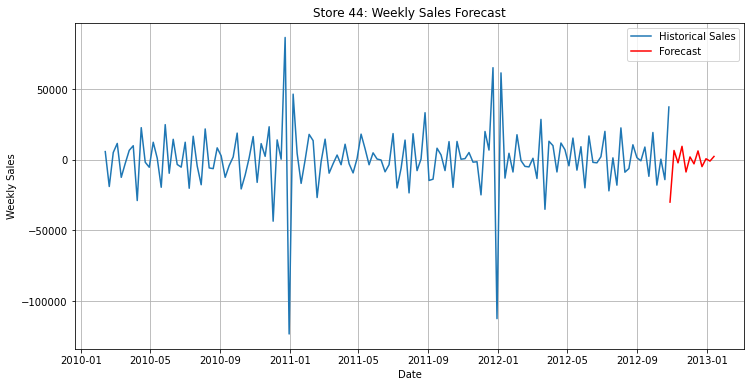


Forecasting for Store 18:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



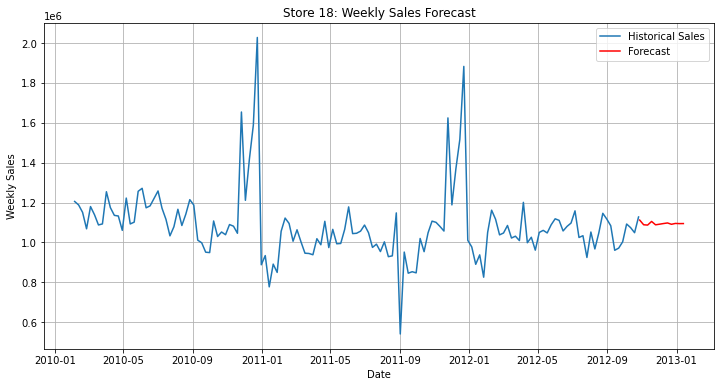


Forecasting for Store 3:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



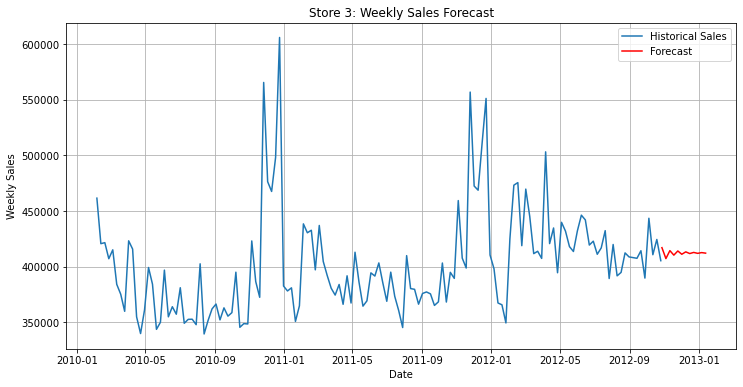


Forecasting for Store 12:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



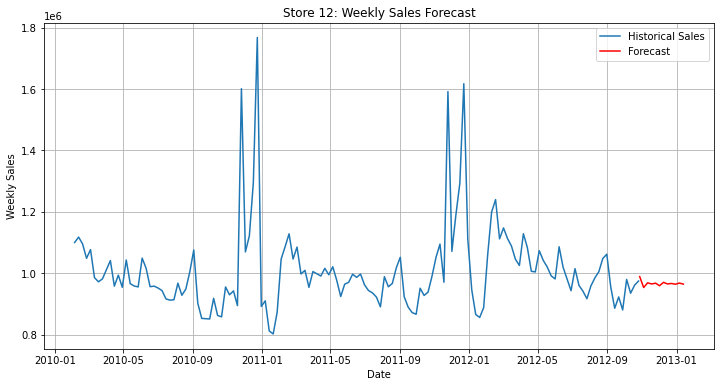


Forecasting for Store 29:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



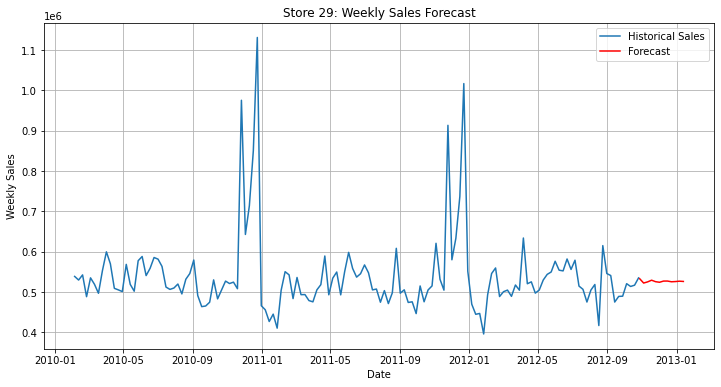


Forecasting for Store 40:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



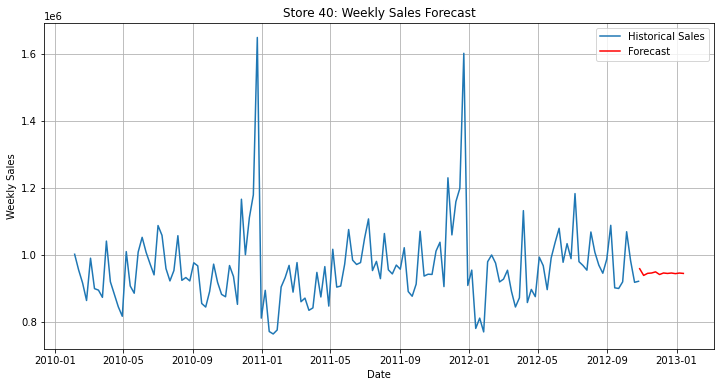


Forecasting for Store 7:


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



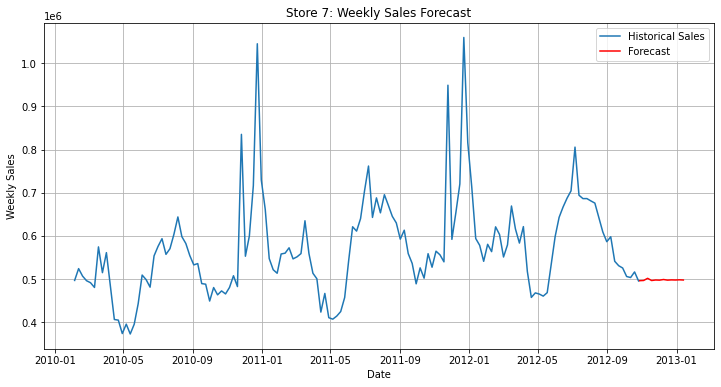


Forecasting for Store 14:
store 14 data is non stationary:differencing required


C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



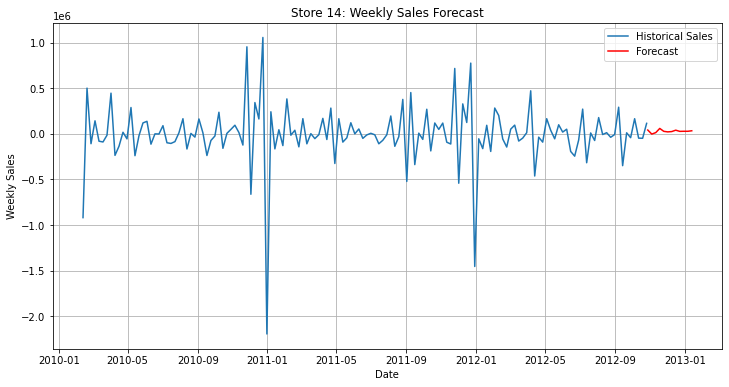

In [42]:
#function to perform forecasting for given store 

def forecast_store_sales(store_id,periods=12):
    store_data = store_sales[store_sales['Store']==store_id]#filter data for specific store
    store_data.set_index('Date',inplace = True)
    store_data = store_data['Weekly_Sales']
    
    adf_test = adfuller(store_data)
    #print(f'store {store_id}: adf test statistics :{adf_test[0]},p_value:{adf_test[1]})
          
    if adf_test[1]>0.05:
          print(f'store {store_id} data is non stationary:differencing required')
          store_data = store_data.diff().dropna()
          
    model = ARIMA(store_data,order=(5, 1, 0))
    model_fit=model.fit()
    
    forecast=model_fit.forecast(steps=periods)      
          
    plt.figure(figsize=(12, 6))
    plt.plot(store_data.index, store_data, label='Historical Sales')
    plt.plot(pd.date_range(store_data.index[-1], periods=periods, freq='W'), forecast, label='Forecast', color='red')
    plt.title(f"Store {store_id}: Weekly Sales Forecast")
    plt.xlabel("Date")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.grid()
    plt.show()

    # Return the forecasted values
    return forecast

# Forecast sales for each store
store_ids = data['Store'].unique()
forecasts = {}

for store_id in store_ids:
    print(f"\nForecasting for Store {store_id}:")
    forecasts[store_id] = forecast_store_sales(store_id, periods=12)      
          
          
          
          
          
          

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



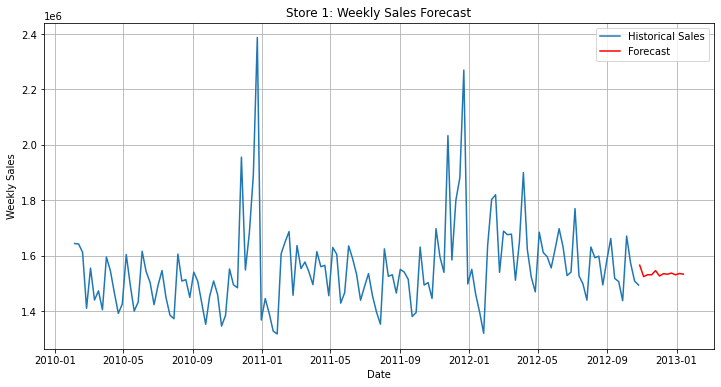

2012-11-02    1.565441e+06
2012-11-09    1.524021e+06
2012-11-16    1.530963e+06
2012-11-23    1.530657e+06
2012-11-30    1.545705e+06
2012-12-07    1.526392e+06
2012-12-14    1.534726e+06
2012-12-21    1.532667e+06
2012-12-28    1.536849e+06
2013-01-04    1.530657e+06
2013-01-11    1.535251e+06
2013-01-18    1.533146e+06
Freq: W-FRI, Name: predicted_mean, dtype: float64

In [43]:
forecast_store_sales(1, periods=12)